In [5]:
import os
import cv2
import numpy as np
import pandas as pd
from tqdm import tqdm
from pathlib import Path
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
image_root = Path("balanced_dataset")

def compute_metrics(img_gray):
    return {
        "brightness": np.mean(img_gray),
        "contrast": np.std(img_gray),
        "laplacian_var": cv2.Laplacian(img_gray, cv2.CV_64F).var()
    }

results = []

# Alle Bilddateien in Unterordnern durchlaufen
for img_path in tqdm(list(image_root.glob("*/*"))):
    if not img_path.is_file():
        continue
    try:
        img_gray = cv2.imread(str(img_path), cv2.IMREAD_GRAYSCALE)
        if img_gray is None:
            continue  

        metrics = compute_metrics(img_gray)
        results.append({
            "path": str(img_path),
            "category": img_path.parent.name,
            **metrics
        })
    except Exception as e:
        print(f"Fehler bei {img_path}: {e}")

100%|██████████| 9891/9891 [22:53<00:00,  7.20it/s]


In [4]:
df = pd.DataFrame(results)
df.to_csv("image_quality_metrics.csv", index=False)
df.head()

,path,category,brightness,contrast,laplacian_var
0,balanced_dataset\acinonyx jubatus\acinonyx jub...,acinonyx jubatus,73.915546,63.964548,149.560021
1,balanced_dataset\acinonyx jubatus\acinonyx jub...,acinonyx jubatus,150.312119,55.113595,893.561320
2,balanced_dataset\acinonyx jubatus\acinonyx jub...,acinonyx jubatus,49.037746,59.553452,385.111400
3,balanced_dataset\acinonyx jubatus\acinonyx jub...,acinonyx jubatus,48.988345,59.596957,380.983017
4,balanced_dataset\acinonyx jubatus\acinonyx jub...,acinonyx jubatus,48.954636,59.593999,382.857377


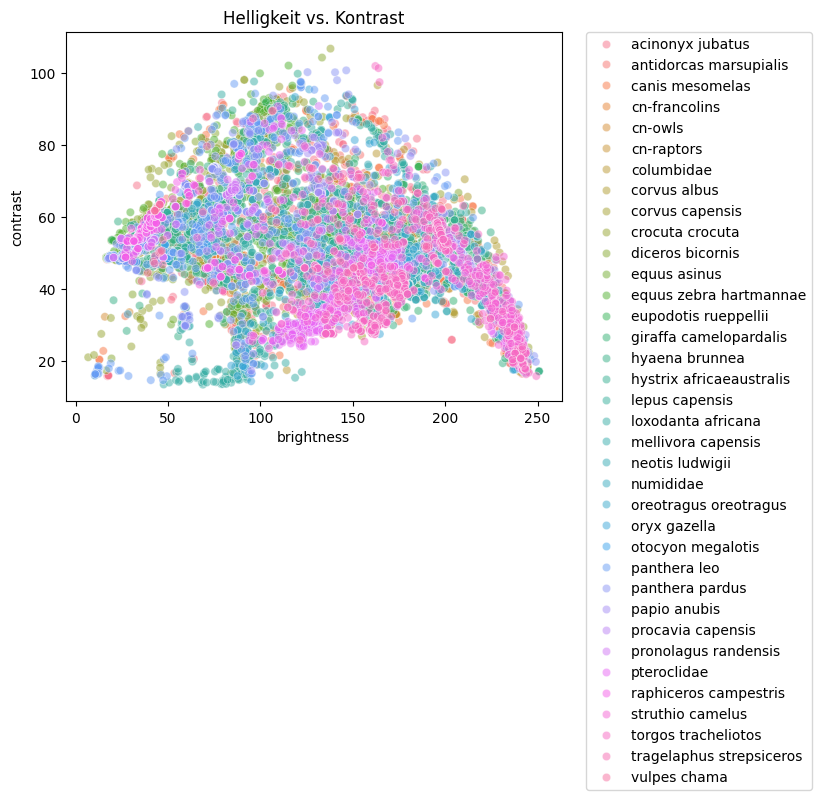

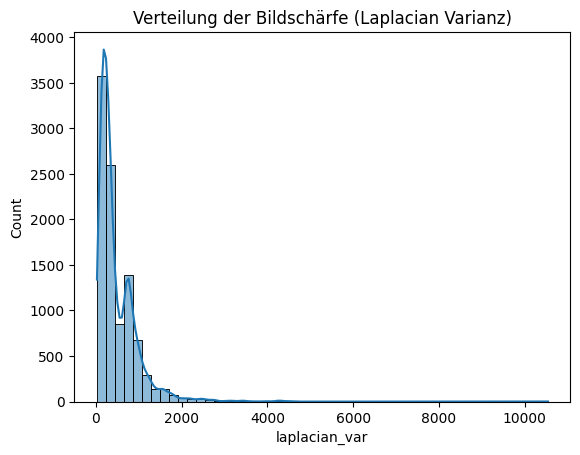

In [ ]:

df = pd.read_csv("image_quality_metrics.csv")

sns.scatterplot(data=df, x="brightness", y="contrast", hue="category", alpha=0.5)
plt.title("Helligkeit vs. Kontrast")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.show()

sns.histplot(df["laplacian_var"], bins=50, kde=True)
plt.title("Verteilung der Bildschärfe (Laplacian Varianz)")
plt.show()


In [4]:
# Schwellenwerte
low_brightness = 25
high_brightness = 225
low_contrast = 18

# Unterbelichtete Bilder
underexposed = df[df["brightness"] < low_brightness].copy()
underexposed["issue"] = "underexposed"

# Überbelichtete Bilder
overexposed = df[df["brightness"] > high_brightness].copy()
overexposed["issue"] = "overexposed"

# Kontrastarme Bilder
low_contrast_imgs = df[df["contrast"] < low_contrast].copy()
low_contrast_imgs["issue"] = "low_contrast"


# Alle "problematischen" Bilder zusammenführen
problem_images = pd.concat([
    underexposed,
    overexposed,
    low_contrast_imgs
], ignore_index=True)

# Ergebnisse speichern
problem_images.to_csv("problematic_images_by_fixed_thresholds.csv", index=False)

print(len(problem_images), "problematische Bilder gefunden.")

1188 problematische Bilder gefunden.


In [2]:
df_problems = pd.read_csv("problematic_images_by_fixed_thresholds.csv")

# Anzahl pro Problemtyp
issue_counts = df_problems["issue"].value_counts()

print("Anzahl der Bilder pro Qualitätsproblem:")
print(issue_counts)


Anzahl der Bilder pro Qualitätsproblem:
issue
overexposed     670
underexposed    343
low_contrast    175
Name: count, dtype: int64


In [3]:
# CSV mit den Problemen laden
df = pd.read_csv("problematic_images_by_fixed_thresholds.csv")

# Nur low contrast Bilder
low_contrast = df[df["issue"] == "low_contrast"]

# Unter- und Überbelichtete Pfade
underexposed_paths = set(df[df["issue"] == "underexposed"]["path"])
overexposed_paths = set(df[df["issue"] == "overexposed"]["path"])

# Schnittmengen berechnen
lc_and_under = low_contrast["path"].isin(underexposed_paths).sum()
lc_and_over = low_contrast["path"].isin(overexposed_paths).sum()

# Insgesamt
total_lc = len(low_contrast)

print(f"Total 'low_contrast' images: {total_lc}")
print(f"…davon auch 'underexposed': {lc_and_under}")
print(f"…davon auch 'overexposed': {lc_and_over}")

# Bilder, die ausschließlich low_contrast sind:
exclusive_lc = total_lc - lc_and_under - lc_and_over
print(f"…davon ausschließlich 'low_contrast': {exclusive_lc}")

Total 'low_contrast' images: 175
…davon auch 'underexposed': 51
…davon auch 'overexposed': 39
…davon ausschließlich 'low_contrast': 85


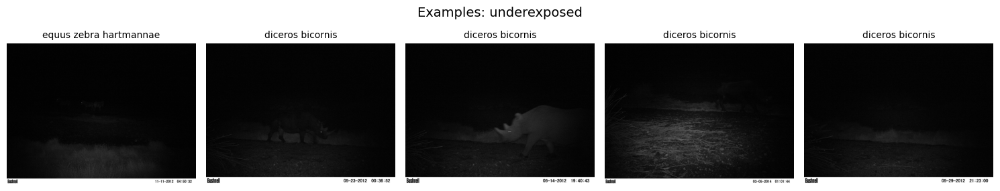

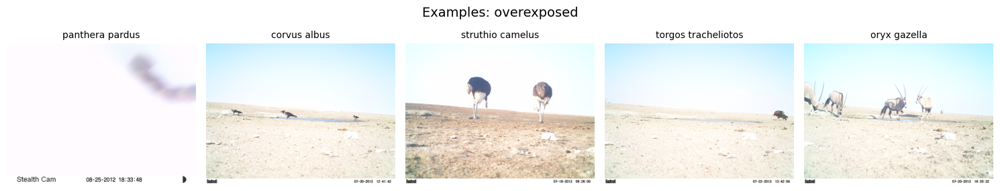

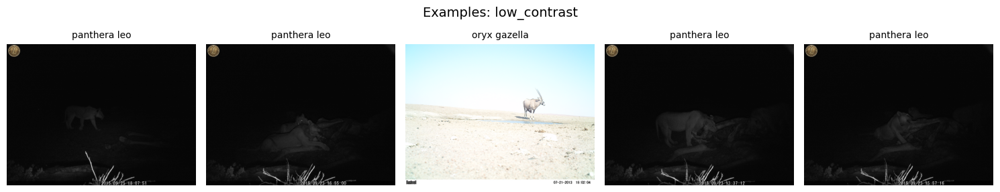

In [6]:
# CSV mit problematischen Bildern laden
df_problems = pd.read_csv("problematic_images_by_fixed_thresholds.csv")

# Liste der Problemkategorien
categories = df_problems["issue"].unique()

# Für jede Kategorie: 5 zufällige Bilder anzeigen
for category in categories:
    samples = df_problems[df_problems["issue"] == category].sample(n=5, random_state=42)

    plt.figure(figsize=(15, 3))
    plt.suptitle(f"Examples: {category}", fontsize=14)

    for i, (_, row) in enumerate(samples.iterrows()):
        img = cv2.imread(row["path"])
        if img is None:
            continue
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        plt.subplot(1, 5, i + 1)
        plt.imshow(img)
        plt.title(row['category'], fontsize=10)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

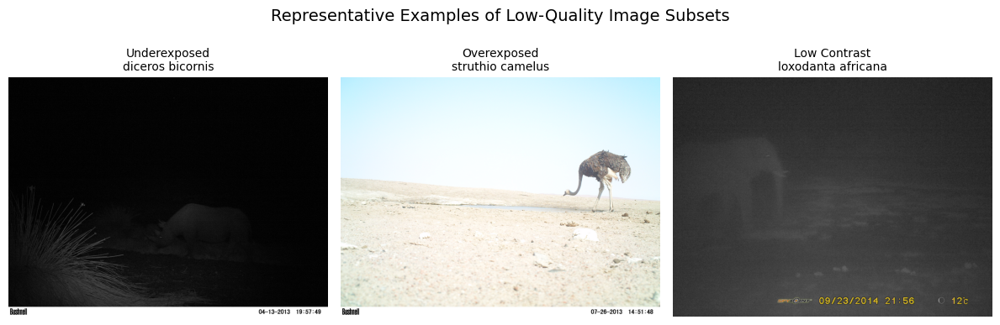

In [14]:
# Einzigartige Qualitätsprobleme (Issues)
categories = df["issue"].unique()

# Abbildung: 1 Zeile, n Spalten (eine pro Qualitätsproblem)
fig, axes = plt.subplots(1, len(categories), figsize=(4 * len(categories), 4))
fig.suptitle("Representative Examples of Low-Quality Image Subsets", fontsize=14)

# Falls nur eine Kategorie existiert, sicherstellen, dass axes eine Liste ist
if len(categories) == 1:
    axes = [axes]

# Für jede Kategorie ein zufälliges Beispielbild anzeigen
for i, issue in enumerate(categories):
    sample = df[df["issue"] == issue].sample(n=1).iloc[0]
    img_path = sample["path"]
    category_name = sample["category"]

    img = cv2.imread(img_path)
    if img is not None:
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        axes[i].imshow(img_rgb)
        axes[i].axis("off")
        # Titel: Issue + Tierkategorie (z. B. "Underexposed – Red Fox")
        axes[i].set_title(f"{issue.replace('_', ' ').title()}\n{category_name}", fontsize=10)
    else:
        axes[i].axis("off")

# Layout optimieren
plt.tight_layout(rect=[0, 0, 1, 0.92])

plt.savefig("figures/low_quality_examples2.pdf", dpi=300)

plt.show()

In [10]:
# problematische Bilder je Kategorie
problematic_images = df.groupby("category")["path"].apply(list).to_dict()
problematic_images = {k: v for k, v in problematic_images.items() if len(v) > 0}

# Anzahl der problematischen Bilder pro Kategorie
problematic_counts = {k: len(v) for k, v in problematic_images.items()}
problematic_counts = dict(sorted(problematic_counts.items(), key=lambda item: item[1], reverse=True))
print("Problematische Bilder pro Kategorie (absteigend):")
for category, count in problematic_counts.items():
    print(f"{category}: {count} Bilder")
    

Problematische Bilder pro Kategorie (absteigend):
struthio camelus: 238 Bilder
oryx gazella: 160 Bilder
diceros bicornis: 153 Bilder
panthera leo: 132 Bilder
antidorcas marsupialis: 76 Bilder
loxodanta africana: 63 Bilder
torgos tracheliotos: 55 Bilder
corvus albus: 51 Bilder
equus zebra hartmannae: 46 Bilder
canis mesomelas: 36 Bilder
crocuta crocuta: 33 Bilder
hyaena brunnea: 22 Bilder
pteroclidae: 20 Bilder
acinonyx jubatus: 17 Bilder
giraffa camelopardalis: 17 Bilder
cn-raptors: 16 Bilder
panthera pardus: 12 Bilder
papio anubis: 10 Bilder
pronolagus randensis: 9 Bilder
equus asinus: 5 Bilder
hystrix africaeaustralis: 5 Bilder
neotis ludwigii: 5 Bilder
corvus capensis: 4 Bilder
cn-owls: 1 Bilder
columbidae: 1 Bilder
raphiceros campestris: 1 Bilder


Anzahl herausfordernder Bilder: 126


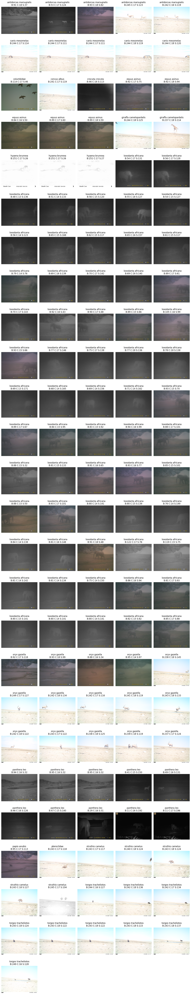

In [6]:
# Beispiel: Bilder mit geringem Kontrast und Schärfe
difficult_images = df[
    (df["contrast"] < 18) &
    (df["laplacian_var"] < 200)
]

print("Anzahl herausfordernder Bilder:", len(difficult_images))

# Anzahl Spalten im Grid
cols = 5
images_to_show = difficult_images  # keine Begrenzung
total = len(images_to_show)
rows = int(np.ceil(total / cols))

# Plot vorbereiten
fig, axs = plt.subplots(rows, cols, figsize=(15, 3 * rows))

for i, (idx, row) in enumerate(images_to_show.iterrows()):
    img = cv2.imread(row['path'])
    if img is None:
        continue
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    ax = axs[i // cols, i % cols] if rows > 1 else axs[i]
    ax.imshow(img_rgb)
    ax.set_title(f"{row['category']}\nB:{row['brightness']:.0f} C:{row['contrast']:.0f} S:{row['laplacian_var']:.0f}")
    ax.axis("off")

# Leere Achsen ausblenden
for j in range(i + 1, rows * cols):
    ax = axs[j // cols, j % cols] if rows > 1 else axs[j]
    ax.axis("off")

plt.tight_layout()
plt.show()


difficult_images.to_csv("challenging_images.csv", index=False)